![](img/574_banner.png)

# Lab 4: Fun with Spatial Data

**Tomas Beuzen, 2021**

![](img/map.png)

## Table of Contents
<hr>

<div class="toc"><ul class="toc-item"><li><span><a href="#Instructions" data-toc-modified-id="Instructions-2">Instructions</a></span></li><li><span><a href="#Imports" data-toc-modified-id="Imports-3">Imports</a></span></li><li><span><a href="#Exercise-1:-How-far-do-I-ride?" data-toc-modified-id="Exercise-1:-How-far-do-I-ride?-4">Exercise 1: How far do I ride?</a></span></li><li><span><a href="#Exercise-2:-How-high-can-they-build?" data-toc-modified-id="Exercise-2:-How-high-can-they-build?-5">Exercise 2: How high can they build?</a></span></li><li><span><a href="#Exercise-3:-How-much-does-it-cost?" data-toc-modified-id="Exercise-3:-How-much-does-it-cost?-6">Exercise 3: How much does it cost?</a></span></li><li><span><a href="#Exercise-4:-How-far-will-you-go?" data-toc-modified-id="Exercise-4:-How-far-will-you-go?-7">Exercise 4: How far will you go?</a></span></li><li><span><a href="#Submit-to-Canvas-and-GitHub" data-toc-modified-id="Submit-to-Canvas-and-GitHub-8">Submit to Canvas and GitHub</a></span></li></ul></div>

## Instructions
<hr>

rubric={mechanics:3}

**Link to your GitHub repository: https://github.ubc.ca/MDS-2020-21/DSCI_574_lab4_lhabashy**

You will receive marks for correctly submitting this assignment. To submit this assignment you should:

1. Push your assignment to your GitHub repository!
2. Provide a link to your repository in the space provided above.
2. Upload a HTML render of your assignment to Canvas. The last cell of this notebook will help you do that.
3. Be sure to follow the [General Lab Instructions](https://ubc-mds.github.io/resources_pages/general_lab_instructions/). You can view a description of the different rubrics used for grading in MDS [here](https://github.com/UBC-MDS/public/tree/master/rubric).

Here's a break down of the required and optional exercises in this lab:

|         | Number of Exercises | Points |
|:-------:|:-------------------:|:------:|
| Mechanics| - | 3 |
| Required| 9 | 31 |
| Optional| 1  | 2 |

## Imports
<hr>

In [1]:
import keplergl
import osmnx as ox
import numpy as np
import pandas as pd
import geopandas as gpd
import plotly.express as px
import matplotlib.pyplot as plt
from shapely.geometry import LineString
#from scripts.utils import pixel2poly
from pykrige.ok import OrdinaryKriging
from canvasutils.submit import submit, convert_notebook
# Plotting defaults
plt.style.use('ggplot')
px.defaults.height = 400; px.defaults.width = 620
plt.rcParams.update({"font.size": 14, "axes.labelweight": "bold", "lines.linewidth": 2, "figure.figsize": (6, 6)})

In [2]:
import itertools
from shapely.geometry import Polygon
def pixel2poly(x, y, z, resolution):
    """
    x: x coords of cell
    y: y coords of cell
    z: matrix of values for each (x,y)
    resolution: spatial resolution of each cell
    """
    polygons = []
    values = []
    half_res = resolution / 2
    for i, j  in itertools.product(range(len(x)), range(len(y))):
        minx, maxx = x[i] - half_res, x[i] + half_res
        miny, maxy = y[j] - half_res, y[j] + half_res
        polygons.append(Polygon([(minx, miny), (minx, maxy), (maxx, maxy), (maxx, miny)]))
        if isinstance(z, (int, float)):
            values.append(z)
        else:
            values.append(z[j, i])
    return polygons, values

## Exercise 1: How far do I ride?
<hr>

This exercise is all about getting practice working with vector data, geometries, and `geopandas`. And yes, you will be working with my cycling data again (remember it from DSCI 511?). This time we'll be working with some data of a bike ride from my place in downtown Vancouver to UBC (directly exported from the Strava app if you know it).

### 1.1.

rubric={accuracy:3}

In your lab repo is a file `data/tom-ride.csv`. It contains latitude and longitude pairs for one of my bicycle rides from home (downtown Vancouver) to UBC.

I want you to:
1. Load the data into a regular `pandas` DataFrame;
2. Create a `LINESTRING` geometry (i.e., a line) from the latitudes and longitudes in that file. We didn't specifically do this in lecture, but you can do it using the `shapely` function `LineString()` (which we imported at the top of the notebook). You need to pass a list of "coordinates" (as `(longitude, latitude)` tuples) to that function to create a line - there's lots of ways to make a list of tuples but hint: `coordinates=zip(longitude, latitude)`.
3. Create a GeoDataFrame with the geometry column containing your `LineString`. Specify the projection "EPSG:4326" (standard for lat/lon coordinates) using the `crs` argument. Note that your GeoDataFrame will only have a single row, as we only have a single geometry here (a line).
4. Estimate the total length of my ride **in meters**. Hint: you'll need to temporarily convert to a meter-based projection (I recommend "EPSG:3347") and use the `.length` attribute.

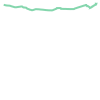

In [3]:
# Your answer goes here.
df = pd.read_csv('data/tom-ride.csv')
coordinates=zip(df['Longitude'], df['Latitude'])
LineString(coordinates)

In [4]:
subset = df[['Longitude', 'Latitude']]
tuples = [tuple(x) for x in subset.values]

In [5]:
aline = LineString(tuples)

In [6]:
lines = gpd.GeoDataFrame(geometry = [aline],
                         crs="EPSG:4326") 
lines

,geometry
0,"LINESTRING (-123.12169 49.27835, -123.12162 49..."


In [7]:
ride_len = lines.to_crs(epsg=3347)
print(f"The total length of Tom's ride is {ride_len.length[0]:.3f} meters.")

The total length of Tom's ride is 8486.554 meters.


### 1.2.

rubric={viz:3}

In your lab repo there a shapefile `data/vancouver-fsa` that contains polygons of FSAs ([forward sortation areas](https://www.ic.gc.ca/eic/site/bsf-osb.nsf/eng/br03396.html) - which are just groups of postcodes) in Vancouver - it's the same data we made in [Lecture 7 here](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture7_intro-to-spatial.html#question-3-what-fsa-in-vancouver-has-the-most-bike-lanes-by-length).

Load that shapefile into a new GeoDataFrame and then, using the `geopandas` in-built plotting functionality, plot my bicycle ride on top of the map of Vancouver FSAs.

In [8]:
# Your answer goes here.
fsa = gpd.read_file("data/vancouver-fsa")
fsa = fsa.to_crs("EPSG:4326")
fsa.head()

,CFSAUID,PRUID,PRNAME,geometry
0,V5Z,59,British Columbia / Colombie-Britannique,"POLYGON ((-123.11483 49.26939, -123.11482 49.2..."
1,V6A,59,British Columbia / Colombie-Britannique,"POLYGON ((-123.09187 49.28789, -123.09179 49.2..."
2,V7B,59,British Columbia / Colombie-Britannique,"MULTIPOLYGON (((-123.22218 49.23591, -123.2222..."
3,V6S,59,British Columbia / Colombie-Britannique,"MULTIPOLYGON (((-123.22382 49.27782, -123.2238..."
4,V6T,59,British Columbia / Colombie-Britannique,"POLYGON ((-123.22388 49.27739, -123.22336 49.2..."


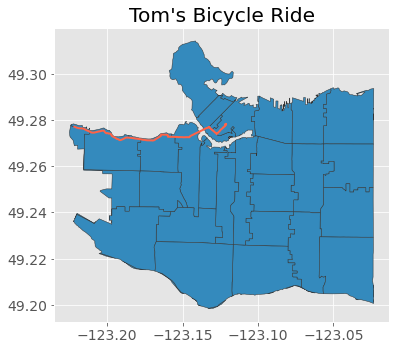

In [9]:
ax = fsa.plot(edgecolor="0.2")
lines.plot(ax=ax, edgecolor="tomato", linewidth=2)
plt.title("Tom's Bicycle Ride");

### 1.3.

rubric={reasoning:3}

Your last task is to programmatically calculate how many FSAs I rode through on my ride (i.e., write code to do this, don't just count them with your eyes!). Questions like this (about overlapping geometries) can be very easily answered with a spatial join (`gpd.sjoin()`)!

In [10]:
# Your answer goes here.
joined_data = gpd.sjoin(fsa, lines, how="inner", op="intersects")
joined_data

,CFSAUID,PRUID,PRNAME,geometry,index_right
4,V6T,59,British Columbia / Colombie-Britannique,"POLYGON ((-123.22388 49.27739, -123.22336 49.2...",0
7,V6Z,59,British Columbia / Colombie-Britannique,"POLYGON ((-123.12405 49.27991, -123.12564 49.2...",0
12,V6B,59,British Columbia / Colombie-Britannique,"MULTIPOLYGON (((-123.11493 49.28847, -123.1149...",0
14,V6E,59,British Columbia / Colombie-Britannique,"POLYGON ((-123.12278 49.28880, -123.12220 49.2...",0
23,V6J,59,British Columbia / Colombie-Britannique,"MULTIPOLYGON (((-123.14980 49.27790, -123.1498...",0
24,V6K,59,British Columbia / Colombie-Britannique,"POLYGON ((-123.17265 49.27171, -123.17104 49.2...",0
33,V6R,59,British Columbia / Colombie-Britannique,"POLYGON ((-123.21376 49.27669, -123.21346 49.2...",0


In [11]:
print(f"Tom rode through {len(joined_data)} FSAs on his ride.")

Tom rode through 7 FSAs on his ride.


## Exercise 2: How high can they build?
<hr>

rubric={viz:10}

In this exercise I'll get you to make a cool 3D plot of downtown Vancouver building heights using `kepler.gl`. Your tasks:

1. Load downtown Vancouver building footprints into a GeoDataFrame using `osmnx`. Use the `ox.geometries_from_place()` function and search for "Downtown, Vancouver, Canada" and don't forget to set `tags={"building":True}` to get building footprints! You should also drop any point geometries in the loaded data - we only care about polygons (see [this part of Lecture 7](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture7_intro-to-spatial.html#loading-from-open-street-map) for code help).
2. Download downtown Vancouver buidling heights from the [City of Vancouver Open Data Portal here](https://opendata.vancouver.ca/explore/dataset/building-footprints-2009/map/?location=11,49.25633,-123.14257).
    - You should use the polygon selection tool to select only data in downtown Vancouver as in the screenshot below:
![](img/selection-tool.png)
    - Then export the data as a shapefile by clicking the "Export" tab and choosing the shapefile export:
![](img/export.png)
3. Load in your freshly downloaded building height data to a GeoDataFrame and then spatially join the building heights to the building footprints (like I did [in lecture here](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture8_spatial-viz-and-modelling.html#kepler-gl)). The column "`hgt_agl`" is the one with the buidling heights (columns are described [here](https://opendata.vancouver.ca/explore/dataset/building-footprints-2009/information/));
4. Finally, use `keplergl` to make a map of the data and customize it using the GUI to be a 3D map.

I did this whole mapping process with a different dataset in [Lecture 8 here](like I did [in lecture here](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture8_spatial-viz-and-modelling.html#kepler-gl) so refer to that for code help.

>Your `keplergl` figure won't automatically save with your notebook when your export it to html. So you can **just take a screenshot of it and include it below**.

In [12]:
# Your answer goes here.

gdf_dt = ox.geometries_from_place("Downtown, Vancouver, Canada", tags={"building":True})
van = gdf_dt[gdf_dt.geom_type == 'Polygon']
van.head(2)

,unique_id,osmid,element_type,building,name,geometry,addr:city,addr:housenumber,addr:postcode,addr:street,...,check_date:opening_hours,second_hand,nohousenumber,min_height,unisex,service:vehicle:detailing,rooms,takeaway,ways,type
6,way/24705904,24705904,way,stadium,BC Place,"POLYGON ((-123.11352 49.27631, -123.11329 49.2...",NaN,777,NaN,Pacific Boulevard,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,way/24705911,24705911,way,stadium,Rogers Arena,"POLYGON ((-123.10901 49.27844, -123.10881 49.2...",NaN,800,NaN,Griffiths Way,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
fp = gpd.read_file("data/building-footprints-2009")
fp = fp.to_crs("EPSG:4326")
fp.head(2)

/Users/larahabashy/Downloads/miniconda3/envs/mds574/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,id,orient8,bldgid,topelev_m,med_slope,baseelev_m,hgt_agl,rooftype,area_m2,avght_m,minht_m,maxht_m,base_m,len,wid,geometry
0,155205.0,-44.6464,149535.0,37.11,6.0,23.5,13.61,Flat,2287.940,11.1,0.64,17.24,24.38,94.56,36.14,"POLYGON ((-123.13668 49.28516, -123.13700 49.2..."
1,155210.0,-43.4519,147601.0,35.21,13.0,23.5,11.71,Flat,616.103,8.7,0.00,11.83,23.05,33.98,18.13,"POLYGON ((-123.13909 49.28393, -123.13899 49.2..."


In [14]:
bldg_heights = (gpd.sjoin(van, fp[["hgt_agl", "geometry"]], how="inner")
                       .rename(columns={"hgt_agl": "Height"})
                       .reset_index()
                       .dissolve(by="index", aggfunc="mean")  # dissolve is like "groupby" in pandas. We use it because it retains geometry information
                   )
bldg_heights.head(2)

/Users/larahabashy/Downloads/miniconda3/envs/mds574/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,geometry,osmid,index_right,Height
index,,,,
6,"POLYGON ((-123.11357 49.27683, -123.11342 49.2...",24705904.0,2490.900000,22.997000
7,"POLYGON ((-123.10855 49.27836, -123.10826 49.2...",24705911.0,2316.142857,27.782857


In [15]:
height_map = keplergl.KeplerGl(height=500)
height_map.add_data(data=bldg_heights.copy(), name="Building heights")
height_map.save_to_html(file_name="keplergl.html")

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter
Map saved to keplergl.html!


/Users/larahabashy/Downloads/miniconda3/envs/mds574/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [16]:
%%html
<iframe src="keplergl.html" width="80%" height="500"></iframe>

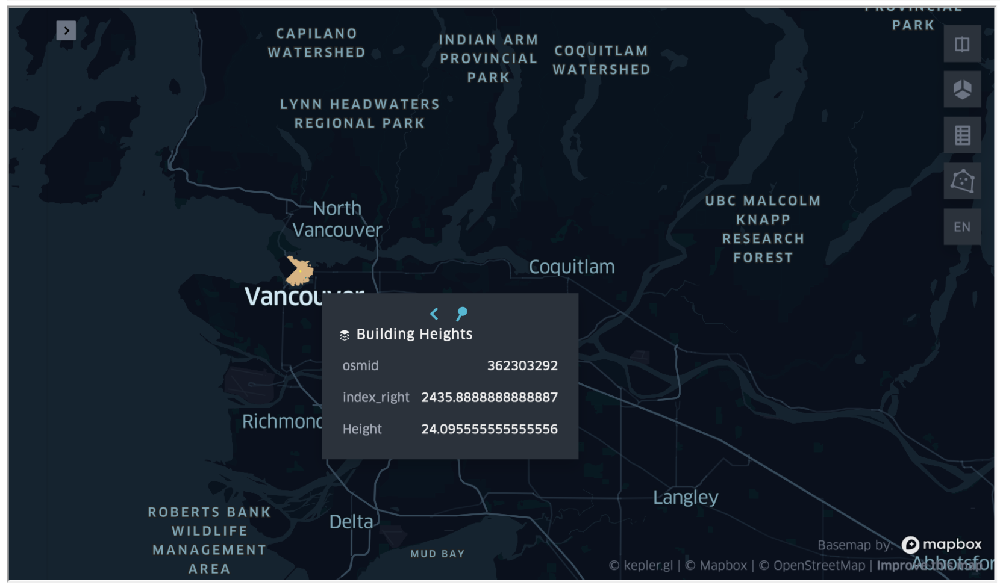

In [17]:
from IPython.display import Image
Image(filename='img/2.png')

## Exercise 3: How much does it cost?
<hr>

In this exercise, we'll walk through some spatial interpolation. In particular we'll look at kriging. We went over this at a very high level in lecture. There's so much to learn about kriging and it's really getting into the GIS world which we don't have time to explore. I just want you to have an idea of the kind of things you can do with spatial data and to know where to start looking if you do have to do a job that involves spatial interpolation in the future - I don't expect you or need you to know the details of the kriging model! We'll be mostly mimicking [the worklflow I did in Lecture 8](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture8_spatial-viz-and-modelling.html#probabilistic-geostatistical-spatial-interpolation) so feel free to refer to it for code help.

We are going to be using a sample of the daily cost of AirBnB's currently around Vancouver to interpolate the daily cost across all of Vancouver to get a sense of which areas are the cheapest/most expensive to stay in! Before we get started, what areas do you think will be most expensive? Kitsilano? Downtown? Let's see what the data says...

### 3.1.

rubric={reasoning:2}

We'll get our data from [Inside AirBnB](http://insideairbnb.com/index.html). You can get the most recent summary of AirBnB listings for Vancouver from this url: "http://data.insideairbnb.com/canada/bc/vancouver/2021-02-09/visualisations/listings.csv", load that data into a regular dataframe directly with `pandas`. Filter the dataframe so it only includes data where `price < 500` and `number_of_reviews > 0`.

In [18]:
# Your answer goes here.
url = "http://data.insideairbnb.com/canada/bc/vancouver/2021-02-09/visualisations/listings.csv"

bnb = pd.read_csv(url)
bnb = bnb[(bnb['price'] < 500) & (bnb['number_of_reviews']> 0)]
bnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10080,D1 - Million Dollar View 2 BR,30899,Rami,NaN,Downtown,49.28772,-123.12279,Entire home/apt,150,90,16,2017-02-26,0.14,41,345
1,13358,Monthly (or Longer ) Designer One Bedroom Down...,52116,Lynn,NaN,West End,49.28209,-123.12515,Entire home/apt,90,30,430,2021-01-01,3.32,1,70
2,13490,Vancouver's best kept secret,52467,Iris,NaN,Kensington-Cedar Cottage,49.25622,-123.06607,Entire home/apt,145,30,88,2020-10-31,0.75,1,291
3,14267,EcoLoft Vancouver,56030,Peter & Alison,NaN,Kensington-Cedar Cottage,49.24974,-123.08108,Entire home/apt,199,3,33,2020-02-07,0.26,1,0
4,16254,Close to PNE/Hastings Park and East Village,63238,Jason,NaN,Hastings-Sunrise,49.27734,-123.04152,Entire home/apt,195,3,5,2019-08-19,0.16,1,228


### 3.2.

rubric={accuracy:1}

Create a new `GeoDataFrame` from your AirBnB data. You'll need to create the geometry column using the function `gpd.points_from_xy()` like we did in [lecture here](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture7_intro-to-spatial.html#making-data).

In [19]:
# Your answer goes here.
bnb_gd = gpd.GeoDataFrame(bnb,
                          crs="EPSG:4326",  
                          geometry=gpd.points_from_xy(bnb["longitude"], bnb["latitude"]))
bnb_gd.head()

/Users/larahabashy/Downloads/miniconda3/envs/mds574/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry
0,10080,D1 - Million Dollar View 2 BR,30899,Rami,NaN,Downtown,49.28772,-123.12279,Entire home/apt,150,90,16,2017-02-26,0.14,41,345,POINT (-123.12279 49.28772)
1,13358,Monthly (or Longer ) Designer One Bedroom Down...,52116,Lynn,NaN,West End,49.28209,-123.12515,Entire home/apt,90,30,430,2021-01-01,3.32,1,70,POINT (-123.12515 49.28209)
2,13490,Vancouver's best kept secret,52467,Iris,NaN,Kensington-Cedar Cottage,49.25622,-123.06607,Entire home/apt,145,30,88,2020-10-31,0.75,1,291,POINT (-123.06607 49.25622)
3,14267,EcoLoft Vancouver,56030,Peter & Alison,NaN,Kensington-Cedar Cottage,49.24974,-123.08108,Entire home/apt,199,3,33,2020-02-07,0.26,1,0,POINT (-123.08108 49.24974)
4,16254,Close to PNE/Hastings Park and East Village,63238,Jason,NaN,Hastings-Sunrise,49.27734,-123.04152,Entire home/apt,195,3,5,2019-08-19,0.16,1,228,POINT (-123.04152 49.27734)


### 3.3.

rubric={viz:3}

Make a scatterplot of your dataframe using the `plotly.express` function `px.scatter_mapbox()`. Be sure to specify the argument `mapbox_style` to a style that does not require an API token (the default [does require a token](https://plotly.com/python/mapbox-layers/) and your code will output nothing). Take a look at the docstring for examples, or see the code examples in [Lecture 8 here](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture8_spatial-viz-and-modelling.html#plotly).

/Users/larahabashy/Downloads/miniconda3/envs/mds574/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


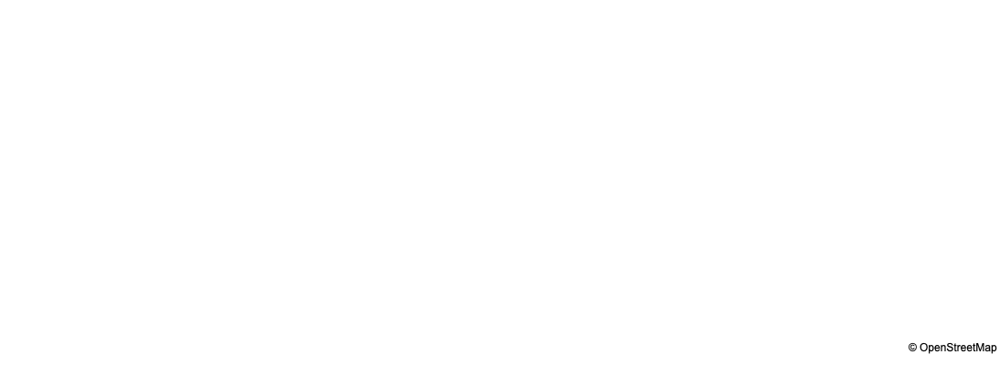

In [20]:
# Your answer goes here.

scatter = px.scatter_mapbox(bnb_gd, lat = bnb_gd["latitude"], lon = bnb_gd["longitude"], zoom=12.5,
                           mapbox_style="open-street-map")
scatter.update_layout(margin=dict(l=0, r=0, t=30, b=10))

/Users/larahabashy/Downloads/miniconda3/envs/mds574/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



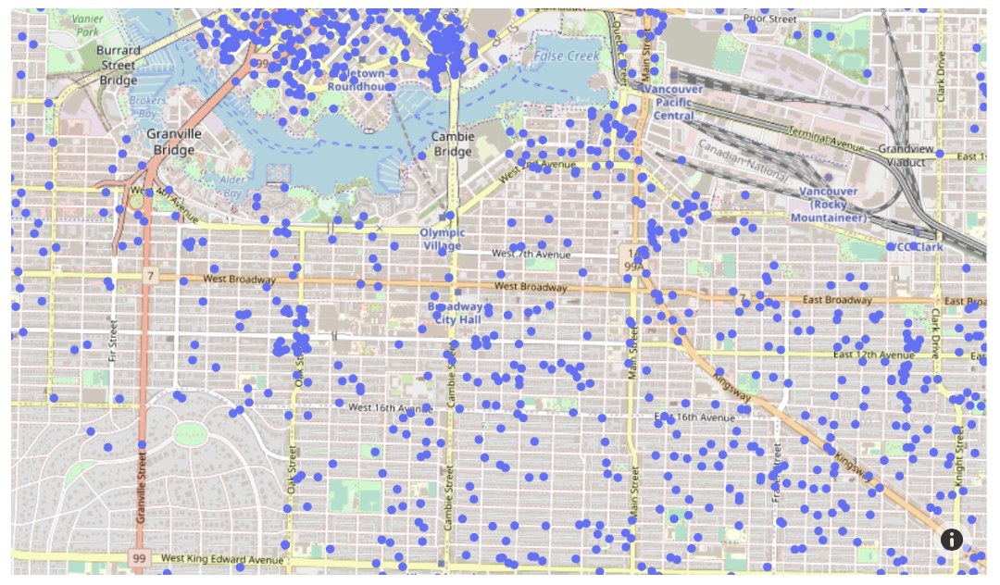

In [21]:
from IPython.display import Image
Image(filename='img/3_3.png')

### 3.4.

rubric={accuracy:3}

Now it's time to create a grid of spatial locations and interpolate over them. I went through this exact process in [Lecture 8 here](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture8_spatial-viz-and-modelling.html#deterministic-spatial-interpolation) so use that as your guide! But basically, the tasks are as follows:
1. Convert your geodataframe to the linear meter-based Lambert projection (recommend by Statistics Canada). The code is "EPSG:3347".
2. Add an "Easting" and "Northing" column to your geodataframe.
3. Make a vector of x values and y values that define a grid (I called them `gridx` and `gridy` in the lecture notes) using a resolution of 250 m.
4. Interpolate the data using `pykrige.ok.OrdinaryKriging` (which we imported at the top of the notebook). You'll have to [install](https://geostat-framework.readthedocs.io/projects/pykrige/en/stable/#installation) `pykrige` if you don't have it installed: `conda install -c conda-forge pykrige`.

Once again, see [this part of the lecture notes](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture8_spatial-viz-and-modelling.html#probabilistic-geostatistical-spatial-interpolation) for an example of how to do all this.

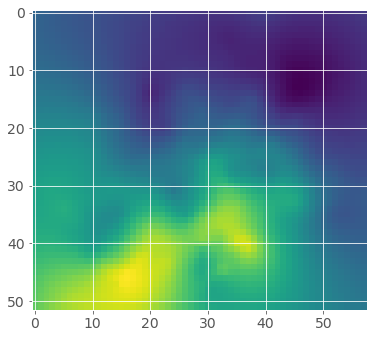

In [22]:
# Your answer goes here.

# convert geo df to linear meter based lambert proj
bnb_lmb = (gpd.GeoDataFrame(bnb_gd, crs="EPSG:4326",
                            geometry=gpd.points_from_xy(bnb_gd["longitude"], bnb_gd["latitude"])).to_crs("EPSG:3347"))

# add easting and northing cols
bnb_lmb["Easting"], bnb_lmb["Northing"] = bnb_lmb.geometry.x, bnb_lmb.geometry.y

# vector that defines a grid
resolution = 250  
gridx = np.arange(bnb_lmb.bounds.minx.min(), bnb_lmb.bounds.maxx.max(), resolution)
gridy = np.arange(bnb_lmb.bounds.miny.min(), bnb_lmb.bounds.maxy.max(), resolution)

# interpolate data usign pykridge
krig = OrdinaryKriging(x=bnb_lmb["Easting"], y=bnb_lmb["Northing"], z=bnb_lmb["price"], variogram_model="spherical")
z, ss = krig.execute("grid", gridx, gridy)
plt.imshow(z);

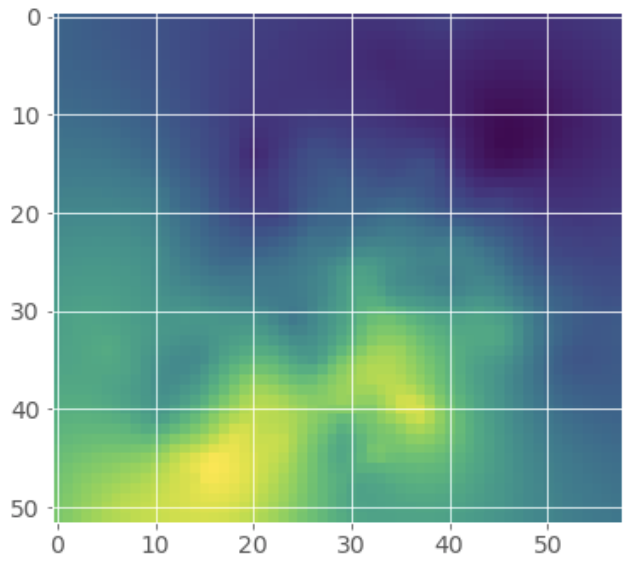

In [23]:
from IPython.display import Image
Image(filename='img/3_4.png')

### 3.5.

rubric={accuracy:3}

Finally, we can re-project our inteprolated data back to a map. You'll need to:
1. Convert your interpolated raster data to polygons using the `pixel2poly()` function I used in lecture and included with your lab (we imported it at the top of the notebook).
2. Create a geodataframe of your new polygons and interpolated values. You should specify in the geodataframe creation that your polygon coordinates are in `crs="EPSG:3347"`. But then convert the geodataframe to the degrees based WGS 84 project (`.to_crs("EPSG:4326")`) so that we can plot it.
3. Clip this geodataframe with a polygon of Vancouver loaded using `ox.geocode_to_gdf("Vancouver, Canada")`. 
4. Finally, plot your interpolated data and bathe in the glory of your awesome mapping skills! (Hopefully you should see that Kitsilano and Downtown are the most expensive places to stay - which is not surprising!)

Once again, see [this part of the lecture notes](https://pages.github.ubc.ca/MDS-2020-21/DSCI_574_spat-temp-mod_students/lectures/lecture8_spatial-viz-and-modelling.html#probabilistic-geostatistical-spatial-interpolation) for an example of this workflow.

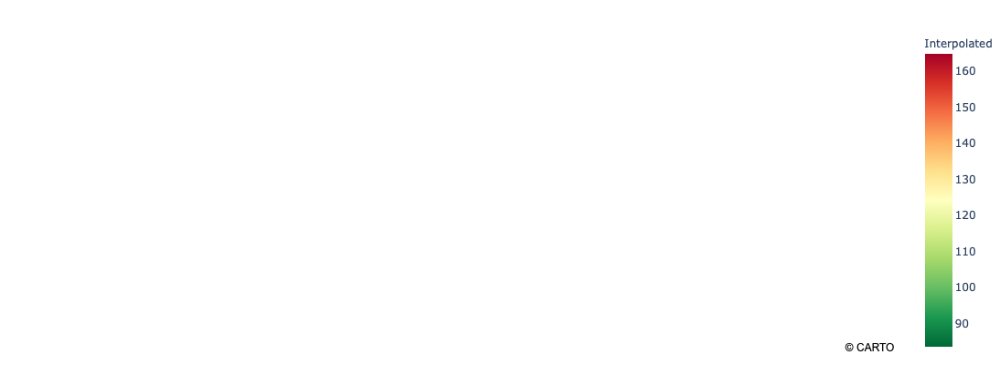

In [24]:
# Your answer goes here.

# convert interpolated data to polygons
polygons, values = pixel2poly(gridx, gridy, z, resolution)

# create a geo df
olygons, values = pixel2poly(gridx, gridy, z, resolution)
bnb_model = (gpd.GeoDataFrame({"Interpolated": values}, geometry=polygons, crs="EPSG:3347")
                 .to_crs("EPSG:4326")
                 )

# clip with polygon of Vancouver
bc = ox.geocode_to_gdf("Vancouver, Canada")
bnb_model = gpd.clip(bnb_model, bc)

# plot interpolated
fig = px.choropleth_mapbox(bnb_model, geojson=bnb_model.geometry, locations=bnb_model.index,
                            opacity=0.5, color="Interpolated", color_continuous_scale="RdYlGn_r",
                           center={"lat": 49.2827, "lon": -123.1207}, zoom=3.5,
                           mapbox_style="carto-positron")
fig.update_layout(margin=dict(l=0, r=0, t=30, b=10))
fig.update_traces(marker_line_width=0)

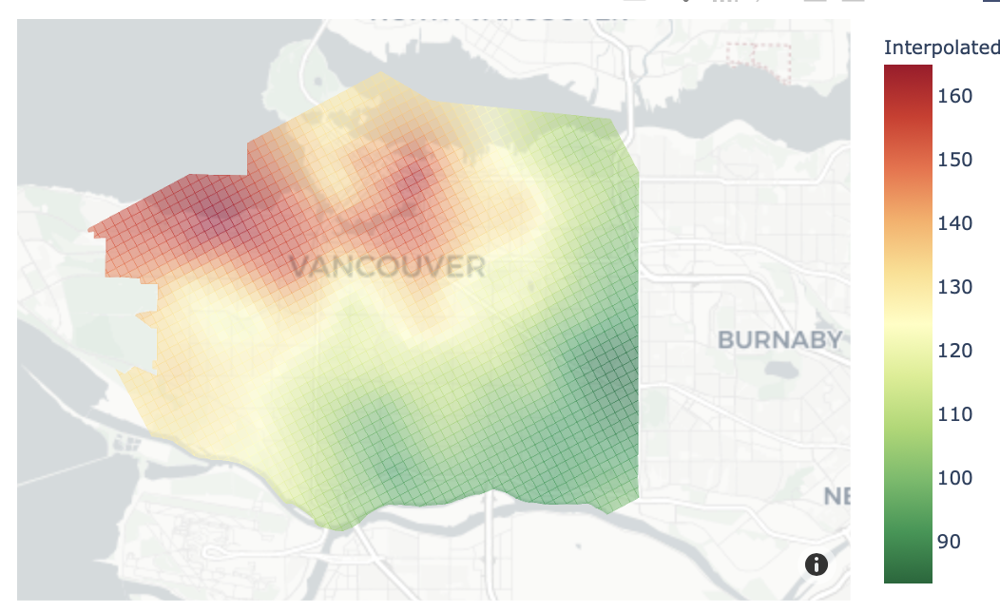

In [25]:
from IPython.display import Image
Image(filename='img/3_5.png')

## (Optional) Exercise 4: How far will you go?
<hr>

rubric={accuracy:2}

This is our last lab together 😢 So free optional marks this week.

It's been an absolute pleasure working with you this past year! I'm so proud of us all for making it through what has been a unique and often difficult year. I hope you can take a moment to appreciate what you've accomplished in getting to this point. Wherever life takes you next, I truly wish you all the best. The GIF below is not from Marvel (which is better than DC in my opinion), but hey, Superman is pretty cool - fly high! 🚀

![](img/fly.gif)

## Submit to Canvas and GitHub
<hr>

When you are ready to submit your assignment do the following:
1. Run all cells in your notebook to make sure there are no errors by doing `Kernel -> Restart Kernel and Run All Cells...`
2. Save your notebook.
3. Convert your notebook to `.html` format using the `convert_notebook()` function below or by `File -> Export Notebook As... -> Export Notebook to HTML`
4. Run the code `submit()` below to go through an interactive submission process to Canvas.
5. Finally, push all your work to GitHub (including the rendered html file).

In [26]:
# convert_notebook("lab4.ipynb", "html")  # save your notebook, then uncomment and run when you want to convert to html

In [27]:
# submit(course_code=59092)  # uncomment and run when ready to submit to Canvas